4. Oscilador de Van der Pol


$$
 \text{Cuantitativo:} \quad F=m\frac{d^2x}{dt}= - kx + \mu (1-x^2) \frac{dx}{dt} \Rightarrow  \ddot x + kx = \mu (1-x^2) \dot x  %\\ x(t)=A cos(\omega t+\phi)= B cos(\omega t) + C sen(\omega t)\\
$$

$$
 \text{Cualitativo:} \quad  a_x=\frac{dv_x}{dt} \land \quad v_x=\frac{dx}{dt} \land \quad v_1=Mult(kx) 
    \land \quad v_2=Sum(a_x,v_1) \land \quad k=const(k_0)>0 \land \quad \\ \mu=const(\mu_0)>0 \land \quad v_3=U^-(x) \land \quad v_2 = Mult(\mu,v_3)
$$

$$
    \text{Cualitativo2:} \quad x''+ U^+_{(0,-1)}(x)x' + x = 0 \iff  x + x'' = U^-_{(0,1)}(x)x'
$$


$$
    \text{Cualitativo3:} \quad x''+ U^+_{(0,-1)}(x)x' + x = 0 \iff  x'' + U^+_{(0,-1)}(x)x' = -x 
$$


In [5]:
#import QSIM #imports all submodules
from QSIM import * #imports all functions and classes

# Definir PSR

In [6]:
#basic landmarks
zero=landmark_value("0",0)
inf=landmark_value("inf",1,is_finite=False)
neg_inf=landmark_value("-inf",-1,is_finite=False)
one=landmark_value("1",Sign(1))

#### Define variables

#time
t0=landmark_value("t0",0)
t_qs=quantity_space("t",[t0,inf])

qv_t0=qualitative_value(t0,Sign(1))
qv_t0_none_sign=qualitative_value(t0,Sign(None))

#add dt as a variable
dt_qs=quantity_space(variable="dt",landmarks_list=[zero,one])
dt_qs.set_maximum_limit(one)
dt_qs.set_minimum_limit(zero)

#x
x0=landmark_value("x0",-1)
minus_one=landmark_value("-1",-1)
x_qs=quantity_space("x",[neg_inf,minus_one,zero,one,inf])

#qv_x0=qualitative_value(one,Sign(None))

#vx
vx0=landmark_value("vx0",Sign(1))
vx_qs=quantity_space("vx",[neg_inf,zero,vx0,inf])

#ax
#ax0=landmark_value("ax0",-1)
ax_qs=quantity_space("ax",[neg_inf,zero,inf])

#qv_ax0=qualitative_value(ax0,Sign(None))

#u_x
one=landmark_value("1",Sign(1))
u_x0=landmark_value("ux0",1)
u_x_qs=quantity_space("v1",[neg_inf,zero,one,inf])

#rhs
rhs_qs=quantity_space("v2",[neg_inf,zero,inf])



#Constraints
dt_x_vx=Derivative(quantity_spaces=[x_qs,vx_qs])
dt_vx_ax=Derivative(quantity_spaces=[vx_qs,ax_qs])

dt_t_dt=Derivative(quantity_spaces=[t_qs,dt_qs])
const_dt_pos=Constant(quantity_spaces=[dt_qs],current_value=one)

uminus_x=U([x_qs,u_x_qs],type=Sign(-1),a=zero,b=one)

mult_ux_vx_rhs=Mult([u_x_qs,vx_qs,rhs_qs])
add_x_ax_rhs=Add([x_qs,ax_qs,rhs_qs])


# add initial corresponding values for U constriant

#x=0,u=1
uminus_x.evaluate_tuple(x_qv=qualitative_value(zero,0),y_qv=qualitative_value(one,0),add_if_satisfies=True)

#x=1,u=0
uminus_x.evaluate_tuple(x_qv=qualitative_value(one,0),y_qv=qualitative_value(zero,0),add_if_satisfies=True)
uminus_x.evaluate_tuple(x_qv=qualitative_value(one,1),y_qv=qualitative_value(zero,-1),add_if_satisfies=True)
uminus_x.evaluate_tuple(x_qv=qualitative_value(one,-1),y_qv=qualitative_value(zero,1),add_if_satisfies=True)

#x=-1,u=0
uminus_x.evaluate_tuple(x_qv=qualitative_value(minus_one,0),y_qv=qualitative_value(zero,0),add_if_satisfies=True)
uminus_x.evaluate_tuple(x_qv=qualitative_value(minus_one,1),y_qv=qualitative_value(zero,1),add_if_satisfies=True)
uminus_x.evaluate_tuple(x_qv=qualitative_value(minus_one,-1),y_qv=qualitative_value(zero,-1),add_if_satisfies=True)
uminus_x




#vars,Q, C
all_q_spaces=[t_qs,x_qs,vx_qs,ax_qs,dt_qs,u_x_qs,rhs_qs]#vx_squared_qs,KE_qs,PE_qs,E_qs]
V=[qs.variable for qs in all_q_spaces]

Q={}
for qs in all_q_spaces:
    Q[qs.variable]=qs

C=[dt_x_vx,dt_vx_ax,dt_t_dt,const_dt_pos,uminus_x,add_x_ax_rhs,mult_ux_vx_rhs]
   #mult_vx_vx_vx_squared,mplus_vxsq_ke,mplus_x_pe,add_ke_pe_E,const_E]

In [7]:
V,Q,C

(['t', 'x', 'vx', 'ax', 'dt', 'v1', 'v2'],
 {'t': t: t0 ... inf,
  'x': x: -inf ... -1 ... 0 ... 1 ... inf,
  'vx': vx: -inf ... 0 ... vx0 ... inf,
  'ax': ax: -inf ... 0 ... inf,
  'dt': dt: 0 ... 1,
  'v1': v1: -inf ... 0 ... 1 ... inf,
  'v2': v2: -inf ... 0 ... inf},
 [⟨ (d/dt x vx)⟩,
  ⟨ (d/dt vx ax)⟩,
  ⟨ (d/dt t dt)⟩,
  ⟨ (const dt)⟩,
  ⟨ (U-_(0, 1) x v1)  (⟨1, dec⟩, ⟨0, inc⟩), (⟨-1, inc⟩, ⟨0, inc⟩), (⟨-1, std⟩, ⟨0, std⟩), (⟨-1, dec⟩, ⟨0, dec⟩), (⟨1, std⟩, ⟨0, std⟩), (⟨0, std⟩, ⟨1, std⟩), (⟨1, inc⟩, ⟨0, dec⟩)⟩,
  ⟨ ( ADD x ax v2)  (⟨0, dec⟩, ⟨0, std⟩, ⟨0, dec⟩), (⟨0, inc⟩, ⟨0, dec⟩, ⟨0, inc⟩), (⟨0, std⟩, ⟨0, std⟩, ⟨0, std⟩), (⟨0, inc⟩, ⟨0, dec⟩, ⟨0, std⟩), (⟨0, inc⟩, ⟨0, dec⟩, ⟨0, dec⟩), (⟨0, inc⟩, ⟨0, std⟩, ⟨0, inc⟩), (⟨0, inc⟩, ⟨0, inc⟩, ⟨0, inc⟩), (⟨0, dec⟩, ⟨0, dec⟩, ⟨0, dec⟩), (⟨0, dec⟩, ⟨0, inc⟩, ⟨0, inc⟩), (⟨0, std⟩, ⟨0, dec⟩, ⟨0, dec⟩), (⟨0, dec⟩, ⟨0, inc⟩, ⟨0, std⟩), (⟨0, std⟩, ⟨0, inc⟩, ⟨0, inc⟩), (⟨0, dec⟩, ⟨0, inc⟩, ⟨0, dec⟩)⟩,
  ⟨ ( MULT v1 vx v2)⟩])

# Resovler PSR 

In [13]:
from anytree import AsciiStyle, ContRoundStyle, ContStyle, DoubleStyle

#initial state
Dbar={'t':qv_t0_none_sign,'x':qualitative_value(one,None),'vx':qualitative_value(vx0,None),'ax':qualitative_value(None,None),
      'v1':qualitative_value(zero,None),'v2':qualitative_value(zero,None)}
initial_conditions_state0=Qualitative_State(Dbar)


qv_none_both=qualitative_value(None,None)
Trans_conditions=[False]
vdp_root0_weak_criteria=QSIM(V,Q,C,Trans_conditions,initial_conditions_state0,time_var="t",cycle_match_criteria="weak",max_breadth=20000,max_depth=15)

for pre, fill, node in RenderTree(vdp_root0_weak_criteria,style=ContRoundStyle()): 
    if node.name["cycle_loc"]==None:
        print(str(pre)+str(node.name["loc"])+":"+str({key: node.name["State"].get(key,qv_none_both) for key in V})+" ") #make sure that dictionary is printed in the order of V
    else:
        print(str(pre)+str(node.name["loc"])+":"+str({key: node.name["State"].get(key,qv_none_both) for key in V})+" -> "+str(node.name["cycle_loc"]))

0


100%|██████████| 1/1 [00:00<00:00, 60.10it/s]


1


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


2


100%|██████████| 3/3 [00:00<00:00, 22.57it/s]


3


100%|██████████| 3/3 [00:10<00:00,  3.39s/it]


4


100%|██████████| 5/5 [00:00<00:00, 31.76it/s]


5


100%|██████████| 9/9 [00:26<00:00,  2.97s/it]


6


100%|██████████| 15/15 [00:00<00:00, 29.96it/s]


7


100%|██████████| 33/33 [01:42<00:00,  3.12s/it]


8


100%|██████████| 63/63 [00:01<00:00, 42.66it/s]


9


100%|██████████| 145/145 [11:03<00:00,  4.57s/it]


10


100%|██████████| 320/320 [00:32<00:00,  9.98it/s]


11


100%|██████████| 744/744 [42:52<00:00,  3.46s/it]  


12


100%|██████████| 1914/1914 [01:17<00:00, 24.70it/s]


13


100%|██████████| 4414/4414 [4:01:44<00:00,  3.29s/it]  


(-1, 0):{'t': ⟨t0, None⟩, 'x': ⟨1, None⟩, 'vx': ⟨vx0, None⟩, 'ax': ⟨None, None⟩, 'dt': ⟨None, None⟩, 'v1': ⟨0, None⟩, 'v2': ⟨0, None⟩} 
╰── (0, 0):{'t': ⟨t0, inc⟩, 'x': ⟨1, inc⟩, 'vx': ⟨vx0, dec⟩, 'ax': ⟨(-inf, 0), dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨0, dec⟩, 'v2': ⟨0, dec⟩} 
    ╰── (1, 0):{'t': ⟨(t0, inf), inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨(0, vx0), dec⟩, 'ax': ⟨(-inf, 0), dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨(-inf, 0), dec⟩, 'v2': ⟨(-inf, 0), dec⟩} 
        ├── (2, 0):{'t': ⟨t1, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨vx1, dec⟩, 'ax': ⟨-inf, dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨-inf, dec⟩, 'v2': ⟨-inf, dec⟩} 
        ├── (2, 1):{'t': ⟨t1, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨vx1, dec⟩, 'ax': ⟨-inf, dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨-inf, dec⟩, 'v2': ⟨-inf, std⟩} 
        ╰── (2, 2):{'t': ⟨t1, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨(0, vx0), dec⟩, 'ax': ⟨(-inf, 0), dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨(-inf, 0), dec⟩, 'v2': ⟨v21, std⟩} 
            ├── (3, 0):{'t': ⟨(t1, inf), inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨(0, vx0), dec⟩, '

In [ ]:
#export tree to .txt for detailed view
with open("Tree_Outputs/04-Oscilador_de_Van_der_Pol.txt","w") as f:
    for pre, fill, node in RenderTree(vdp_root0_weak_criteria): 
        if node.name["cycle_loc"]==None:
            print(str(pre)+str(node.name["loc"])+":"+str({key: node.name["State"].get(key,qv_none_both) for key in V})+" ",file=f) #make sure that dictionary is printed in the order of V
        else:
            print(str(pre)+str(node.name["loc"])+":"+str({key: node.name["State"].get(key,qv_none_both) for key in V})+" -> "+str(node.name["cycle_loc"]),file=f)

In [36]:
for pre, fill, node in RenderTree(vdp_root): 
    if node.name["cycle_loc"]==None:
        print(str(pre)+str(node.name["loc"])+":"+str({key: node.name["State"].get(key,qv_none_both) for key in V})+" ") #make sure that dictionary is printed in the order of V
    else:
        print(str(pre)+str(node.name["loc"])+":"+str({key: node.name["State"].get(key,qv_none_both) for key in V})+" -> "+str(node.name["cycle_loc"]))

(-1, 0):{'t': ⟨t0, None⟩, 'x': ⟨1, None⟩, 'vx': ⟨vx0, None⟩, 'ax': ⟨None, None⟩, 'dt': ⟨None, None⟩, 'v1': ⟨0, None⟩, 'v2': ⟨0, None⟩} 
└── (0, 0):{'t': ⟨t0, inc⟩, 'x': ⟨1, inc⟩, 'vx': ⟨vx0, dec⟩, 'ax': ⟨(-inf, 0), dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨0, dec⟩, 'v2': ⟨0, dec⟩} 
    └── (1, 0):{'t': ⟨(t0, inf), inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨(0, vx0), dec⟩, 'ax': ⟨(-inf, 0), dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨(-inf, 0), dec⟩, 'v2': ⟨(-inf, 0), dec⟩} 
        ├── (2, 0):{'t': ⟨t1, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨vx1, dec⟩, 'ax': ⟨-inf, dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨-inf, dec⟩, 'v2': ⟨-inf, dec⟩} 
        ├── (2, 1):{'t': ⟨t1, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨vx1, dec⟩, 'ax': ⟨-inf, dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨-inf, dec⟩, 'v2': ⟨-inf, std⟩} 
        └── (2, 2):{'t': ⟨t1, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨(0, vx0), dec⟩, 'ax': ⟨(-inf, 0), dec⟩, 'dt': ⟨1, std⟩, 'v1': ⟨(-inf, 0), dec⟩, 'v2': ⟨v21, std⟩} 
            ├── (3, 0):{'t': ⟨(t1, inf), inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨(0, vx0), dec⟩, '

In [3]:
from anytree.exporter import DictExporter, JsonExporter, DotExporter
import pickle

exporter = DictExporter()
tree_dict=exporter.export(vdp_root0_weak_criteria)

with open('oscilador_de_van_der_pol.pkl', 'wb') as f:
    pickle.dump(tree_dict, f)

# Graficar Soluciones del PSR

In [8]:
#import tree from file
from anytree.importer import DictImporter
import pickle

with open('oscilador_de_van_der_pol.pkl', 'rb') as f:
    loaded_dictionary = pickle.load(f)


importer = DictImporter()
vdp_root = importer.import_(loaded_dictionary)

In [9]:
import networkx as nx
import hypernetx as hnx

constraint_name_translation_mapping={"Derivative":"Derivada","Constant":"Constante","Add":"Suma","Minus[-]":r"$M^-_0$","Plus[+]":r"$M^+_0$","U[+]":r"$U^+$","U[-]":r"$U^-$"}


def get_constraint_name(c):
    name=str(type(c)).split(".")[1]
    if isinstance(c,M) or isinstance(c,U):
        name+=str(c.type)

    new_name=name.replace("'>","")
    for key in constraint_name_translation_mapping:
        new_name=new_name.replace(key,constraint_name_translation_mapping[key])

    return new_name


def hypergraph_plot_from_C(C):
    data = {i: c.variables for i,c in enumerate(C)}
    labels={i: get_constraint_name(c) for i,c in enumerate(C)}
    H = hnx.Hypergraph(setsystem=data)
    hnx.draw(H,with_edge_counts=True,edge_labels=labels)


class HashableDict(dict):
    def __hash__(self):
        return hash(tuple(sorted(self.items())))

 No module named 'igraph'. If you need to use hypernetx.algorithms.hypergraph_modularity, please install additional packages by running the following command: pip install .['all']


c:\ProgramData\Anaconda3\lib\site-packages\hypernetx\classes\entity.py:1387: RuntimeWarning: The values in the array are unorderable. Pass `sort=False` to suppress this warning.
  properties = props.combine_first(self.properties)
c:\ProgramData\Anaconda3\lib\site-packages\hypernetx\classes\entity.py:1390: RuntimeWarning: The values in the array are unorderable. Pass `sort=False` to suppress this warning.
  properties[self._misc_props_col] = self.properties[
c:\ProgramData\Anaconda3\lib\site-packages\hypernetx\classes\entity.py:1387: RuntimeWarning: The values in the array are unorderable. Pass `sort=False` to suppress this warning.
  properties = props.combine_first(self.properties)
c:\ProgramData\Anaconda3\lib\site-packages\hypernetx\classes\entity.py:1390: RuntimeWarning: The values in the array are unorderable. Pass `sort=False` to suppress this warning.
  properties[self._misc_props_col] = self.properties[


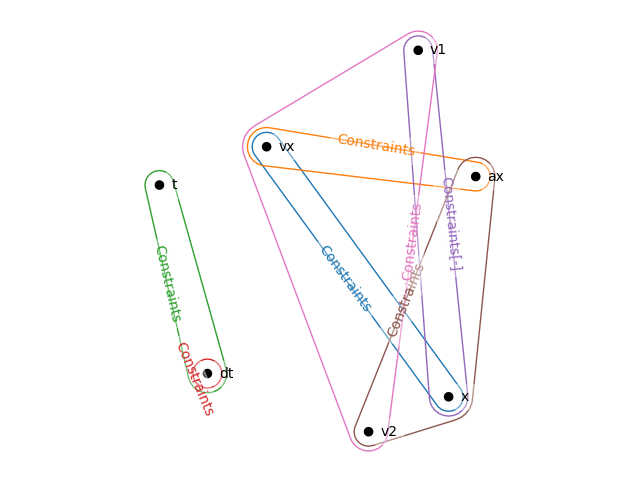

In [10]:
import random
import numpy as np
import matplotlib.pyplot as plt
data = {i: c.variables for i,c in enumerate(C)}
labels={i: get_constraint_name(c) for i,c in enumerate(C)}
H = hnx.Hypergraph(setsystem=data)

#for n in np.linspace(0.1,0.5,10):
# for n in np.arange(35,50,2):
# for n in random.choices(range(1, 101), k=10):
#     print(n)
#     fig, ax = plt.subplots(figsize=(8, 6)) #800x600
#     hnx.draw(H,with_edge_counts=True,with_color=True,edge_labels=labels,ax=ax,layout_kwargs={'seed': n,'k':1})
#     plt.show()

fig, ax = plt.subplots(figsize=(8, 6)) #800x600
hnx.draw(H,with_edge_counts=True,with_color=True,edge_labels=labels,ax=ax,layout_kwargs={'seed': 91,'iterations':50,'k':2})
#plt.savefig('Document Figures/5PSR_osc_van_der_pol.png',bbox_inches='tight', pad_inches=0)

In [11]:
#stationary_behavior=get_behavior_from_leaf(stationary_damped_root.children[0],key=None)[1:]

normal_behaviors=[]
for leaf in vdp_root.leaves:
    normal_behaviors.append(get_behavior_from_leaf(leaf,key=None)[1:])

all_behaviors=normal_behaviors
#all_behaviors=vdp_root0_weak_criteria

In [167]:
len(all_behaviors)

14418

In [12]:
import networkx as nx
import pandas as pd

qv_none_both=qualitative_value(None,None)
#G = nx.DiGraph()

data=[]
#behavior_edges=[]
for i,behavior in enumerate(all_behaviors):
    for j,s in enumerate(behavior):
        state=HashableDict({key: s.name["State"].get(key,qv_none_both) for key in V})
        q=HashableDict(s.name["Q"])
        loc=s.name["loc"]
        cycle_loc=s.name["cycle_loc"]
        data.append([i,state,q,loc,cycle_loc])
        
        # if j>0:
        #     behavior_edges.append([data[-2][1],state])

data_df=pd.DataFrame(data,columns=["Behavior_No","State","Q","loc","cycle_loc"])

#behavior_nodes=data_df.drop_duplicates(subset=["State"])["State"].to_list()
# #add cycle edges
# for index, row in data_df.dropna(subset=["cycle_loc"])[["loc","cycle_loc"]].drop_duplicates().iterrows():
#     loc1,loc2=row["loc"],row["cycle_loc"]
#     state1=data_df[data_df["loc"]==loc1]["State"].iloc[-1]
#     state2=data_df[data_df["loc"]==loc2]["State"].iloc[-1]
#     behavior_edges.append([state1,state2])

# G.add_nodes_from(behavior_nodes)
# G.add_edges_from(behavior_edges)

data_df

,Behavior_No,State,Q,loc,cycle_loc
0,0,"{'t': ⟨t0, inc⟩, 'x': ⟨1, inc⟩, 'vx': ⟨vx0, de...","{'t': t: t0 ... inf, 'x': x: -inf ... -1 ... 0...","(0, 0)",None
1,0,"{'t': ⟨(t0, inf), inc⟩, 'x': ⟨(1, inf), inc⟩, ...","{'t': t: t0 ... inf, 'x': x: -inf ... -1 ... 0...","(1, 0)",None
2,0,"{'t': ⟨t1, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨...","{'t': t: t0 ... t1 ... inf, 'x': x: -inf ... -...","(2, 0)",None
3,1,"{'t': ⟨t0, inc⟩, 'x': ⟨1, inc⟩, 'vx': ⟨vx0, de...","{'t': t: t0 ... inf, 'x': x: -inf ... -1 ... 0...","(0, 0)",None
4,1,"{'t': ⟨(t0, inf), inc⟩, 'x': ⟨(1, inf), inc⟩, ...","{'t': t: t0 ... inf, 'x': x: -inf ... -1 ... 0...","(1, 0)",None
...,...,...,...,...,...
214281,14417,"{'t': ⟨t5, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨...",{'t': t: t0 ... t1 ... t2 ... t3 ... t4 ... t5...,"(10, 319)",None
214282,14417,"{'t': ⟨(t5, inf), inc⟩, 'x': ⟨(1, inf), inc⟩, ...",{'t': t: t0 ... t1 ... t2 ... t3 ... t4 ... t5...,"(11, 743)",None
214283,14417,"{'t': ⟨t6, inc⟩, 'x': ⟨(1, inf), inc⟩, 'vx': ⟨...",{'t': t: t0 ... t1 ... t2 ... t3 ... t4 ... t5...,"(12, 1913)",None
214284,14417,"{'t': ⟨(t6, inf), inc⟩, 'x': ⟨(1, inf), inc⟩, ...",{'t': t: t0 ... t1 ... t2 ... t3 ... t4 ... t5...,"(13, 4413)",None


In [13]:
#Note: nodes with cycle_loc!=None are not necessarily leaves
cycle_ends_df=data_df[~data_df["cycle_loc"].isna()].drop_duplicates(subset=["loc","cycle_loc"],keep="first")

cycles_list=[]
for index, row in cycle_ends_df.iterrows():
    b=all_behaviors[row["Behavior_No"]] 
    loc=row["loc"][0]
    cycle_loc=row["cycle_loc"][0]
    cycle_subbehavior=[node for node in b if node.name["loc"][0]<=loc and node.name["loc"][0]>=cycle_loc]
    cycles_list.append(cycle_subbehavior)

Listado de ciclos hallados (todos representan porciones estáticas del comportamiento en el espacio fase x,vx)

In [65]:
tuple_values=[]

for b in cycles_list:
    #print([f"x={s.name['State']['x']}, vx={s.name['State']['vx']}" for s in b])
    tuple_values.append(set([f"x={s.name['State']['x']}, vx={s.name['State']['vx']}" for s in b]))
    #x_values.append(set([f"x={s.name['State']['x']}" for s in b]))
    #y_values.append(set([f"vx={s.name['State']['vx']}" for s in b]))
#set([tuple(el) for el in x_values]),set([tuple(el) for el in y_values])

set([tuple(el) for el in tuple_values])

{('x=⟨(1, inf), inc⟩, vx=⟨(0, vx0), dec⟩',),
 ('x=⟨(1, x1), dec⟩, vx=⟨(-inf, 0), dec⟩',)}

# Graficar Espacio Fase x,vx

In [101]:
import random, math
import pandas as pd
import matplotlib.pyplot as plt

grid_shape=(1,1)
x_var="x"
y_var="vx"
delta=0.2

x_var_landmarks=[]
y_var_landmarks=[]
for behavior in all_behaviors:
    x_var_landmarks.append(behavior[-1].name["Q"][x_var].landmarks)
    y_var_landmarks.append(behavior[-1].name["Q"][y_var].landmarks)


x_qs_cases_mapping={qs:i for i,qs in enumerate(set(tuple(el) for el in x_var_landmarks))}
y_qs_cases_mapping={qs:i for i,qs in enumerate(set(tuple(el) for el in y_var_landmarks))}

reverse_x_qs_cases_mapping={}
for key, value in x_qs_cases_mapping.items():
    reverse_x_qs_cases_mapping[value] = key

reverse_y_qs_cases_mapping={}
for key, value in y_qs_cases_mapping.items():
    reverse_y_qs_cases_mapping[value] = key


# all_x_landmarks=x_var_landmarks[-1]
# all_y_landmarks=y_var_landmarks[-1]
#all_x_landmarks=[el for el in x_var_landmarks if len(el)>5][0]
#all_y_landmarks=[el for el in y_var_landmarks if len(el)>=5][0]
aux_list=[]
for i,behavior in enumerate(all_behaviors):
    x_case=x_qs_cases_mapping[tuple(behavior[-1].name["Q"][x_var].landmarks)]
    y_case=y_qs_cases_mapping[tuple(behavior[-1].name["Q"][y_var].landmarks)]
    xy_values=tuple([(s.name["State"][x_var],s.name["State"][y_var]) for s in behavior])
    #tuple_values.append(set([f"x={s.name['State']['x']}, vx={s.name['State']['vx']}" for s in b]))
    aux_list.append([i,x_case,y_case,xy_values])
    
aux_df=pd.DataFrame(aux_list,columns=["Behavior No","x_case","y_case","xy_values"])
aux_df.drop_duplicates(subset=["x_case","y_case","xy_values"],keep="first",inplace=True)
aux_df.reset_index(inplace=True,drop=True)

,Behavior No,x_case,y_case,xy_values
0,0,1,3,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."
1,2,1,1,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."
2,3,1,1,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."
3,4,1,1,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."
4,5,1,1,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."
...,...,...,...,...
56,3537,3,0,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."
57,3539,3,0,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."
58,3545,3,4,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."
59,7416,1,3,"((⟨1, inc⟩, ⟨vx0, dec⟩), (⟨(1, inf), inc⟩, ⟨(0..."


In [149]:
aux_q=all_behaviors[3429][-1].name["Q"]
aux_q["x"],aux_q["vx"]

(x: -inf ... -1 ... 0 ... 1 ... x1 ... inf,
 vx: -inf ... vx1 ... vx2 ... 0 ... vx0 ... inf)

In [146]:
for s in all_behaviors[3429]:
    print(s.name["State"]["x"],"\t",s.name["State"]["vx"])

⟨1, inc⟩ 	 ⟨vx0, dec⟩
⟨(1, inf), inc⟩ 	 ⟨(0, vx0), dec⟩
⟨(1, inf), inc⟩ 	 ⟨(0, vx0), dec⟩
⟨(1, inf), inc⟩ 	 ⟨(0, vx0), dec⟩
⟨(1, inf), inc⟩ 	 ⟨(0, vx0), dec⟩
⟨(1, inf), inc⟩ 	 ⟨(0, vx0), dec⟩
⟨x1, std⟩ 	 ⟨0, dec⟩
⟨(1, x1), dec⟩ 	 ⟨(-inf, 0), dec⟩
⟨(1, x1), dec⟩ 	 ⟨(-inf, 0), dec⟩
⟨(1, x1), dec⟩ 	 ⟨(-inf, 0), dec⟩
⟨(1, x1), dec⟩ 	 ⟨vx1, std⟩
⟨(1, x1), dec⟩ 	 ⟨(vx1, 0), inc⟩
⟨(1, x1), dec⟩ 	 ⟨(vx1, 0), inc⟩
⟨(1, x1), dec⟩ 	 ⟨(vx1, 0), inc⟩
⟨(1, x1), dec⟩ 	 ⟨vx2, std⟩


In [102]:
aux_df_gb=aux_df.groupby(by=["x_case","y_case"]).indices
aux_indices=aux_df_gb.keys()
#aux_indices
for i,j in aux_indices:
    print(i,j)
    case_df_indices=aux_df_gb[(i,j)]
    behavior_indices=aux_df.iloc[case_df_indices,0].to_list() 
    print(case_df_indices)
    print(behavior_indices)

0 1
[47]
[2884]
1 1
[1 2 3 4 5 6 7]
[2, 3, 4, 5, 6, 7, 8]
1 3
[ 0 14 15 27 28 59 60]
[0, 200, 207, 1126, 1348, 7416, 12442]
2 1
[45]
[2806]
3 0
[13 19 23 24 25 26 33 35 36 37 38 39 50 51 53 54 55 56 57]
[97, 441, 518, 519, 521, 525, 2507, 2559, 2563, 2565, 2569, 2572, 3426, 3427, 3431, 3437, 3441, 3537, 3539]
3 1
[ 8  9 10 11 12 16 17 18 20 21 22 29 30 31 32 34 40 41 42 43 44 46 48 49]
[13, 27, 91, 92, 93, 434, 435, 436, 445, 449, 498, 2499, 2500, 2501, 2502, 2511, 2583, 2590, 2609, 2613, 2615, 2882, 3066, 3070]
3 2
[52]
[3429]
3 4
[58]
[3545]


In [155]:
for i,b in enumerate(all_behaviors):
    x_value=b[-1].name["State"]["x"]
    vx_value=b[-1].name["State"]["vx"]
    if not x_value.is_finite or not vx_value.is_finite:
        print(i,x_value,vx_value)


2806 ⟨x2, dec⟩ ⟨-inf, dec⟩
2807 ⟨x2, dec⟩ ⟨-inf, dec⟩
2818 ⟨x2, dec⟩ ⟨-inf, dec⟩
2819 ⟨x2, dec⟩ ⟨-inf, dec⟩
2882 ⟨0, dec⟩ ⟨-inf, dec⟩
2883 ⟨0, dec⟩ ⟨-inf, dec⟩
2884 ⟨x2, dec⟩ ⟨-inf, dec⟩
2885 ⟨x2, dec⟩ ⟨-inf, dec⟩
2886 ⟨x2, dec⟩ ⟨-inf, dec⟩
2887 ⟨x2, dec⟩ ⟨-inf, dec⟩
2917 ⟨0, dec⟩ ⟨-inf, dec⟩
2918 ⟨0, dec⟩ ⟨-inf, dec⟩
2919 ⟨x2, dec⟩ ⟨-inf, dec⟩
2920 ⟨x2, dec⟩ ⟨-inf, dec⟩
2921 ⟨x2, dec⟩ ⟨-inf, dec⟩
2922 ⟨x2, dec⟩ ⟨-inf, dec⟩


0 1
1 1
1 3
2 1
3 0
3 1
3 2
3 4


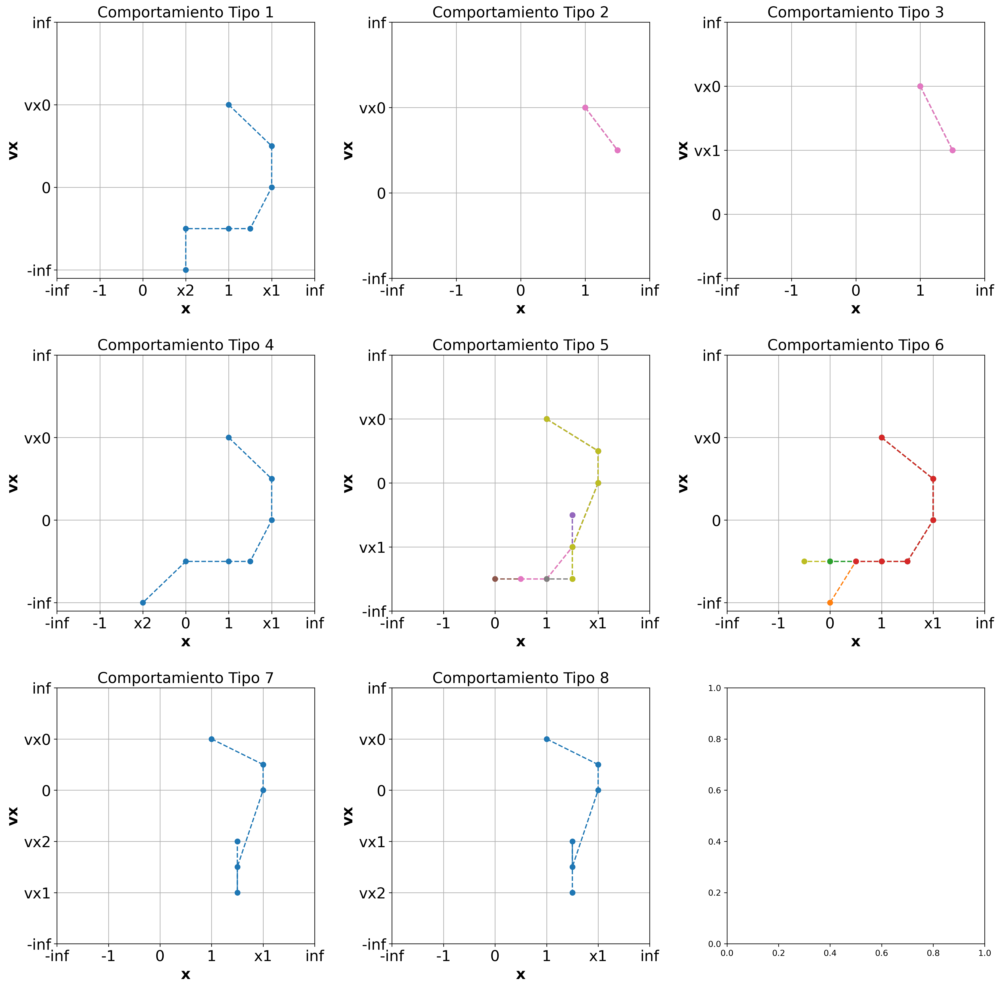

In [183]:
aux_df_gb=aux_df.groupby(by=["x_case","y_case"]).indices
aux_indices=aux_df_gb.keys()

#fig = plt.figure(figsize=(20,20),dpi=720)
cols = 3
rows = math.ceil(len(aux_indices) / cols)
fig, axes = plt.subplots(rows, cols, figsize=(20, 20),dpi=300)
fig.subplots_adjust(wspace=0.3,hspace=0.3)

#aux_values=aux_df_gb.values()
subfig_count=0
for i,j in aux_indices:
    print(i,j)
    case_df_indices=aux_df_gb[(i,j)] #select behaviors in the same case
    behavior_indices=aux_df.iloc[case_df_indices,0].to_list() #get indices of those behaviors in the all_behaviors list
    behaviors_lists=sorted([all_behaviors[i] for i in behavior_indices],key=len) #longest behavior last


    all_x_landmarks=reverse_x_qs_cases_mapping[i]
    all_y_landmarks=reverse_y_qs_cases_mapping[j]

    row_index=math.floor(subfig_count/cols)
    col_index= subfig_count % cols
    ax=axes[row_index][col_index]
    #ax=fig.add_subplot(subfig_count)    
    subfig_count+=1
    #plt.suptitle("test", fontsize=18, y=0.95)

    for s,behavior in enumerate(behaviors_lists):

        behavior_states_list=[s.name["State"] for s in behavior]#get_behavior_from_leaf(leaf_nodes[0],"State")[1:] #ommit partial initial state

        final_x_qs=behavior[-1].name["Q"][x_var].landmarks
        final_y_qs=behavior[-1].name["Q"][y_var].landmarks
        #plt.subplots_adjust(hspace=0.5,wspace=0.5)

        #i=0
        #for x_var,y_var in vars_tuples_list:
            
        #ax = plt.subplot(grid_shape[0], grid_shape[1], 0)
        #i+=1

        x_var_behavior=[s[x_var].qmag for s in behavior_states_list if s[time_var].qmag_type==landmark_value]
        y_var_behavior=[s[y_var].qmag for s in behavior_states_list if s[time_var].qmag_type==landmark_value]

        if len(y_var_behavior)==1 and len(x_var_behavior)==1:
            x_var_behavior=all_x_landmarks #used only for time, when quiescent state appears
        
        if len(set(y_var_behavior))==1: #constant value
            y_var_behavior=[y_var_behavior[0]]*len(x_var_behavior)
        elif len(set(x_var_behavior))==1: #constant value
            x_var_behavior=[x_var_behavior[0]]*len(y_var_behavior)

        assert len(x_var_behavior)==len(y_var_behavior), "lenght missmatch"
        
        
        x_indeces=[]
        y_indeces=[]
        # for k in range(len(x_var_behavior)):
        #     x_value=x_var_behavior[k]
        #     y_value=y_var_behavior[k]
        #     if type(x_value)==landmark_value:
        #         x_indeces.append(all_x_landmarks.index(x_value))
        #     if type(y_value)==landmark_value:
        #         x_indeces.append(all_x_landmarks.index(y_value))

        #     type(x_value)==landmark_value

        for el in x_var_behavior:
            if type(el)==landmark_value:
                x_indeces.append(all_x_landmarks.index(el))
            else:
                index_1=all_x_landmarks.index(el[0])
                index_2=all_x_landmarks.index(el[1])
                x_index_value=(index_1+index_2)/2
                x_indeces.append(x_index_value)
                #if (index_2-index_1)<=2:
                #     x_indeces.append( (index_1+index_2)/2 )
                # elif (index_2-index_1)>2:
                #     random.seed(20) ############## random seed
                #     x_indeces.append(random.uniform(index_1,index_2))
                # else:
                #     raise ValueError(f"{x_var} indeces don't make sense {index_1,index_2}")

        
        for el in y_var_behavior:
            if type(el)==landmark_value:
                y_indeces.append(all_y_landmarks.index(el))
            else:
                index_1=all_y_landmarks.index(el[0])
                index_2=all_y_landmarks.index(el[1])
                y_index_value=(index_1+index_2)/2
                y_indeces.append(y_index_value)
                #if (index_2-index_1)<=2:
                #     y_indeces.append( (index_1+index_2)/2 )
                # elif (index_2-index_1)>2:
                #     random.seed(20) ############## random seed
                #     y_indeces.append(random.uniform(index_1,index_2))
                # else:
                #     raise ValueError(f"{y_var} indeces don't make sense {index_1,index_2}")

        #x_indeces=[(all_x_landmarks.index(el[0])+all_x_landmarks.index(el[1]))/2 if type(el)==tuple else all_x_landmarks.index(el) for el in x_var_behavior]
        #print(y_var_behavior,all_y_landmarks)
        #y_indeces=[(all_y_landmarks.index(el[0])+all_x_landmarks.index(el[1]))/2 if type(el)==tuple else all_y_landmarks.index(el) for el in y_var_behavior]


        ax.plot(x_indeces, y_indeces, marker='o',linestyle='--',label=str(i)) #customize the appearance of the dashed lines by providing a dash tuple to the linestyle parameter. 
        # for i in range(len(x_indeces)):
        #     plt.text(x_indeces[i], y_indeces[i], str(i+1))
        #For example, (0, (3, 10, 1, 15)) means (3pt line, 10pt space, 1pt line, 15pt space) with no offset

    ax.set_xticks(range(len(all_x_landmarks)), all_x_landmarks)
    ax.set_yticks(range(len(all_y_landmarks)), all_y_landmarks)

    ax.tick_params(labelsize=18)
    # for tick in ax.xaxis.get_major_ticks():
    #     tick.label.set_fontsize(16)
    # for tick in ax.yaxis.get_major_ticks():
    #     tick.label.set_fontsize(16)

    ax.set_xlabel(x_var, fontsize=18, fontweight='bold')
    ax.set_ylabel(y_var, fontsize=18, fontweight='bold')

    ax.set_title(f'Comportamiento Tipo {subfig_count}',fontsize=18)
    #ax.title.set_text(f'Comportamiento Tipo {subfig_count}')
    #ax.title

    # ax.set_xticks(range(len(all_x_landmarks)), all_x_landmarks)
    # ax.set_yticks(range(len(all_y_landmarks)), all_y_landmarks)
    # ax.set_xlabel(x_var, fontsize=14, fontweight='bold')
    # ax.set_ylabel(y_var, fontsize=14, fontweight='bold')


    #delta=0.05 #gives a bit of wiggle room to the figure, avoids overlap with axes
    #ceil and floor are included in case of plotting points at qualitative invertals


    # if y_var=="x":
    #     plt.ylim(bottom=math.floor(min(y_indeces)-1)-delta,top=math.ceil(max(y_indeces))+delta)
    # elif y_var=="vx":
    #     #plt.xlim(left=math.floor(min(x_indeces))-delta,right=math.ceil(max(x_indeces))+delta)
    #     plt.ylim(bottom=math.floor(min(y_indeces))-delta,top=math.ceil(max(y_indeces)+1)+delta)

    #ax.set_xlim(left=math.floor(min(x_indeces))-delta,right=math.ceil(max(x_indeces))+delta)
    #ax.set_ylim(bottom=math.floor(min(y_indeces))-delta,top=math.ceil(max(y_indeces))+delta)

    ax.grid(alpha=1)
    #plt.legend()

    plt.savefig('../Document Figures/5osc_amortiguado_x_vx_behavior_types.png',bbox_inches='tight', pad_inches=0.075)
plt.show()

# Graficar variable vs tiempo

In [32]:
import random, math
import matplotlib.pyplot as plt

grid_shape=(1,1)
time_var="t"
x_var="t"
y_var="x"
delta=0.1

x_var_landmarks=[]
y_var_landmarks=[]
for behavior in cycles_list:
    x_var_landmarks.append(behavior[-1].name["Q"][x_var].landmarks)
    y_var_landmarks.append(behavior[-1].name["Q"][y_var].landmarks)

all_x_landmarks=max(set(tuple(x) for x in x_var_landmarks),key=len) #pick longest list out of set of unique lists
all_y_landmarks=max(set(tuple(x) for x in y_var_landmarks),key=len) #pick longest list out of set of unique lists
#all_y_landmarks=y_var_landmarks[-2]

In [33]:
max(set(tuple(x) for x in x_var_landmarks),key=len)

(t0, t1, t2, t3, t4, t5, t6, inf)

In [22]:
set(tuple(x) for x in x_var_landmarks),set(tuple(x) for x in y_var_landmarks)

({(t0, t1, inf),
  (t0, t1, t2, inf),
  (t0, t1, t2, t3, inf),
  (t0, t1, t2, t3, t4, inf),
  (t0, t1, t2, t3, t4, t5, inf),
  (t0, t1, t2, t3, t4, t5, t6, inf),
  (t0, t1, t2, t3, t4, t5, t6, t7, inf)},
 {(-inf, -1, 0, 1, inf),
  (-inf, -1, 0, 1, x1, inf),
  (-inf, -1, 0, x2, 1, x1, inf),
  (-inf, -1, x2, 0, 1, x1, inf)})

In [20]:
set(tuple(x) for x in x_var_landmarks),set(tuple(x) for x in y_var_landmarks)

({(t0, t1, t2, inf),
  (t0, t1, t2, t3, inf),
  (t0, t1, t2, t3, t4, inf),
  (t0, t1, t2, t3, t4, t5, inf),
  (t0, t1, t2, t3, t4, t5, t6, inf)},
 {(-inf, -1, 0, 1, inf), (-inf, -1, 0, 1, x1, inf)})

In [16]:
set(tuple(x) for x in x_var_landmarks),set(tuple(x) for x in y_var_landmarks)

({(t0, t1, inf),
  (t0, t1, t2, inf),
  (t0, t1, t2, t3, inf),
  (t0, t1, t2, t3, t4, inf),
  (t0, t1, t2, t3, t4, t5, inf),
  (t0, t1, t2, t3, t4, t5, t6, inf),
  (t0, t1, t2, t3, t4, t5, t6, t7, inf)},
 {(-inf, 0, vx0, inf),
  (-inf, 0, vx1, vx0, inf),
  (-inf, vx1, 0, vx0, inf),
  (-inf, vx1, vx2, 0, vx0, inf),
  (-inf, vx2, vx1, 0, vx0, inf)})

In [18]:
set(tuple(x) for x in x_var_landmarks),set(tuple(x) for x in y_var_landmarks)

({(t0, t1, t2, inf),
  (t0, t1, t2, t3, inf),
  (t0, t1, t2, t3, t4, inf),
  (t0, t1, t2, t3, t4, t5, inf),
  (t0, t1, t2, t3, t4, t5, t6, inf)},
 {(-inf, 0, vx0, inf)})

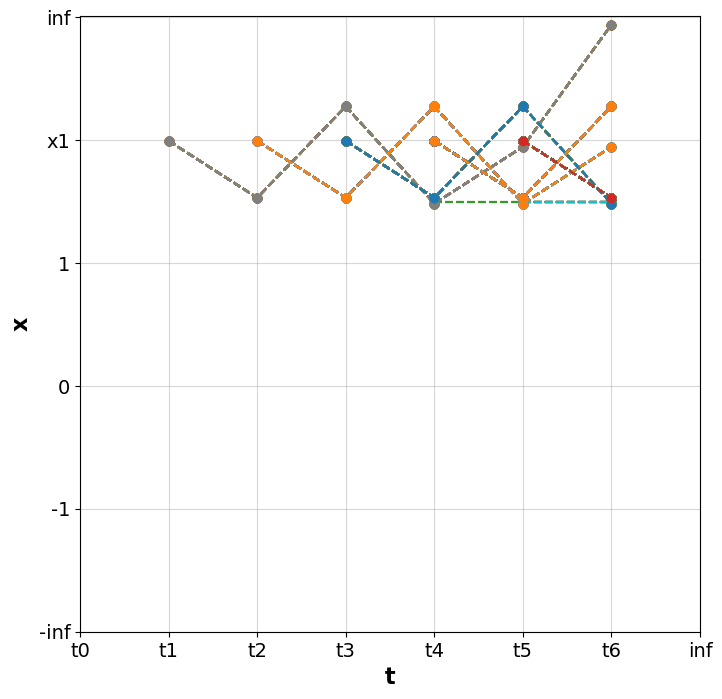

In [43]:
#select two lists
#check if one is sublist of the other
#if yes, select another, and repreat until I have the complete list
#if no, print error


plt.figure()
#plt.suptitle("test", fontsize=18, y=0.95)

for i,behavior in enumerate(cycles_list):

    behavior_states_list=[s.name["State"] for s in behavior]#get_behavior_from_leaf(leaf_nodes[0],"State")[1:] #ommit partial initial state

    #plt.subplots_adjust(hspace=0.5,wspace=0.5)

    #i=0
    #for x_var,y_var in vars_tuples_list:
        
    #ax = plt.subplot(grid_shape[0], grid_shape[1], 0)
    #i+=1

    x_var_behavior=[s[x_var].qmag for s in behavior_states_list if s[time_var].qmag_type==landmark_value]
    y_var_behavior=[s[y_var].qmag for s in behavior_states_list if s[time_var].qmag_type==landmark_value]

    if len(y_var_behavior)==1 and len(x_var_behavior)==1:
        x_var_behavior=all_x_landmarks #used only for time, when quiescent state appears
    
    if len(set(y_var_behavior))==1: #constant value
        y_var_behavior=[y_var_behavior[0]]*len(x_var_behavior)
    elif len(set(x_var_behavior))==1: #constant value
        x_var_behavior=[x_var_behavior[0]]*len(y_var_behavior)


    random.seed(50)

    x_indeces=[]
    for el in x_var_behavior:
        if type(el)==landmark_value:
            x_indeces.append(all_x_landmarks.index(el))
        else:
            index_1=all_x_landmarks.index(el[0])
            index_2=all_x_landmarks.index(el[1])
            if (index_2-index_1)==1:
                x_indeces.append( (index_1+index_2)/2 )
            else:
                raise ValueError(f"{x_var} indeces don't make sense {index_1,index_2}")
            # elif (index_2-index_1)>1:
            #     x_indeces.append(random.uniform(index_1,index_2))

    y_indeces=[]
    for el in y_var_behavior:
        if type(el)==landmark_value:
            y_indeces.append(all_y_landmarks.index(el))
        else:
            index_1=all_y_landmarks.index(el[0])
            index_2=all_y_landmarks.index(el[1])
            if (index_2-index_1)==1:
                y_indeces.append( (index_1+index_2)/2 )
            elif (index_2-index_1)>1:
                y_indeces.append(random.uniform(index_1,index_2))
            else:
                raise ValueError(f"{y_var} indeces don't make sense {index_1,index_2}")

    #x_indeces=[(all_x_landmarks.index(el[0])+all_x_landmarks.index(el[1]))/2 if type(el)==tuple else all_x_landmarks.index(el) for el in x_var_behavior]
    #print(y_var_behavior,all_y_landmarks)
    #y_indeces=[(all_y_landmarks.index(el[0])+all_x_landmarks.index(el[1]))/2 if type(el)==tuple else all_y_landmarks.index(el) for el in y_var_behavior]


    plt.plot(x_indeces, y_indeces, marker='o',linestyle='--',label=str(i)) #customize the appearance of the dashed lines by providing a dash tuple to the linestyle parameter. 
    #For example, (0, (3, 10, 1, 15)) means (3pt line, 10pt space, 1pt line, 15pt space) with no offset

plt.xticks(range(len(all_x_landmarks)), all_x_landmarks)
plt.yticks(range(len(all_y_landmarks)), all_y_landmarks)

plt.tick_params(labelsize=14)
# for tick in ax.xaxis.get_major_ticks():
#     tick.label.set_fontsize(16)
# for tick in ax.yaxis.get_major_ticks():
#     tick.label.set_fontsize(16)

plt.xlabel(x_var, fontsize=16, fontweight='bold')
plt.ylabel(y_var, fontsize=16, fontweight='bold')

# ax.set_xticks(range(len(all_x_landmarks)), all_x_landmarks)
# ax.set_yticks(range(len(all_y_landmarks)), all_y_landmarks)
# ax.set_xlabel(x_var, fontsize=14, fontweight='bold')
# ax.set_ylabel(y_var, fontsize=14, fontweight='bold')


#delta=0.05 #gives a bit of wiggle room to the figure, avoids overlap with axes
#ceil and floor are included in case of plotting points at qualitative invertals

#plt.xlim(left=math.floor(min(x_indeces))-delta,right=math.ceil(max(x_indeces))+delta)
#plt.ylim(bottom=math.floor(min(y_indeces))-delta,top=math.ceil(max(y_indeces))+delta)

# ax.set_xlim(left=math.floor(min(x_indeces))-delta,right=math.ceil(max(x_indeces))+delta)
# ax.set_ylim(bottom=math.floor(min(y_indeces))-delta,top=math.ceil(max(y_indeces))+delta)

plt.grid(alpha=0.5)
#plt.legend()
#plt.savefig('Document Figures/4osc_arm_sim_vx_t_behaviors.png',bbox_inches='tight', pad_inches=0.075)
plt.show()

In [64]:
behavior_nodes=[]
behavior_edges=[]
for i,behavior in enumerate(cycles_list):
    for j,s in enumerate(behavior):
        loc=s.name["loc"]
        state=HashableDict({key: s.name["State"].get(key,qv_none_both) for key in V})
        if j==0:
            starting_state=state
        behavior_nodes.append(state)
        if j>0:
            behavior_edges.append([behavior_nodes[-2],state])
    behavior_edges.append([state,starting_state])
#add cycle edges
# for index, row in data_df.dropna(subset=["cycle_loc"])[["loc","cycle_loc"]].drop_duplicates().iterrows():
#     loc1,loc2=row["loc"],row["cycle_loc"]
#     state1=data_df[data_df["loc"]==loc1]["State"].iloc[-1]
#     state2=data_df[data_df["loc"]==loc2]["State"].iloc[-1]
#     behavior_edges.append([state1,state2])

G = nx.DiGraph()
G.add_nodes_from(behavior_nodes)
G.add_edges_from(behavior_edges)

In [127]:
#pos=nx.spectral_layout(G)
#pos=nx.shell_layout(G) #x
#pos=nx.random_layout(G)
#pos=nx.circular_layout(G) #x
#pos=nx.kamada_kawai_layout(G,) #x
#pos=nx.planar_layout(G) #x


#use grandalf's Sugiyama algorithm to compute positions
V_dict = {node: Vertex(node) for node in G.nodes()}
gr_vertices = list(V_dict.values())
gr_edges = [Edge(V_dict[edge[0]], V_dict[edge[1]]) for edge in G.edges()]
G_grandalf = Graph(gr_vertices, gr_edges)


class defaultview(object):
    w,h = 10,10
for v in gr_vertices: 
    v.view = defaultview()

sugiyama_dicts_list=[]
sub_graph_list=[]
for component in G_grandalf.C: #G_grandalf.C lists the connected components as subgraphs

    sug = SugiyamaLayout(component)  
    sug.init_all()#(roots=[gr_vertices[1]],inverted_edges=[gr_vertices[4].e_to(gr_vertices[0])])
    sug.draw()

    #pos_sugiyama={}
    pos_aux_dict={}
    sub_graph=nx.DiGraph()
    sub_graph_nodes=[]
    sub_graph_edges=[]
    for e in component.sE:
        v1,v2=e.v
        aux_dict[v1.data]=np.array([v1.view.xy[0],v1.view.xy[1]])
        aux_dict[v2.data]=np.array([v2.view.xy[0],v2.view.xy[1]])
        #print("%s: (%d,%d)"%(v.data,v.view.xy[0],v.view.xy[1]))
        #aux_dict[v.data]=np.array([v.view.xy[0],v.view.xy[1]])
        sub_graph_nodes.extend([v1.data,v2.data])
        sub_graph_edges.append([v1.data,v2.data])
        
    
    sub_graph.add_nodes_from(sub_graph_nodes)
    sub_graph.add_edges_from(sub_graph_edges)
    sub_graph_list.append(sub_graph)
        #sub_graph_edges.append(v.data)

    sugiyama_dicts_list.append(pos_aux_dict)
pos_sugiyama = {k: v for d in sugiyama_dicts_list for k, v in d.items()}

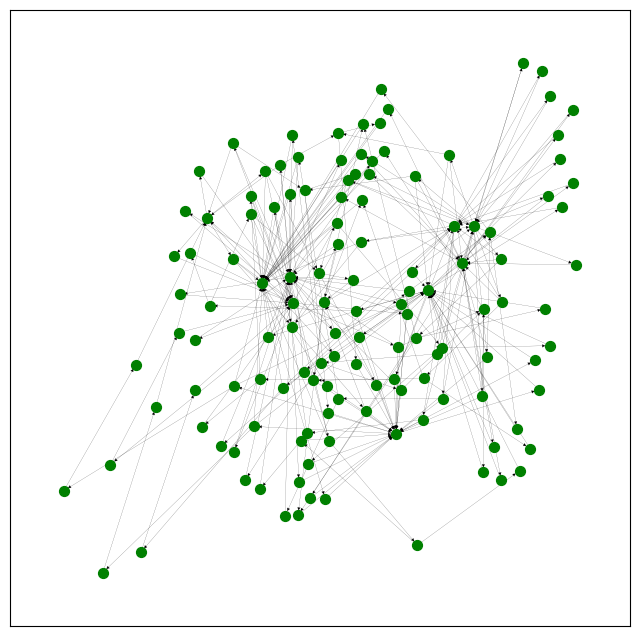

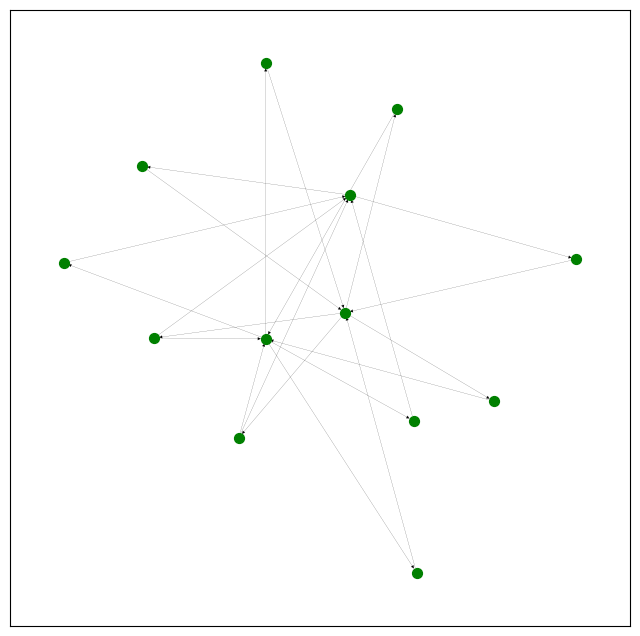

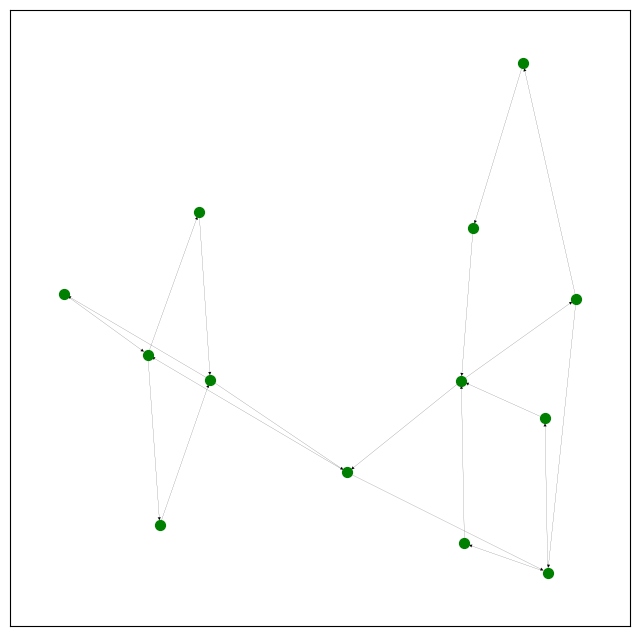

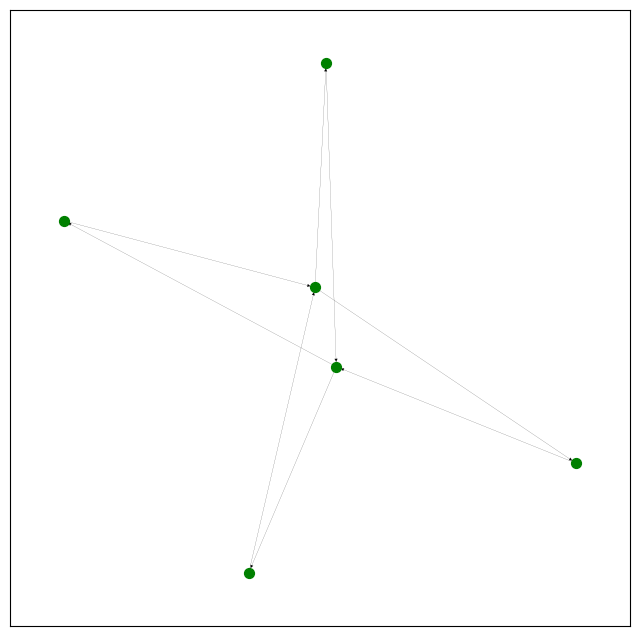

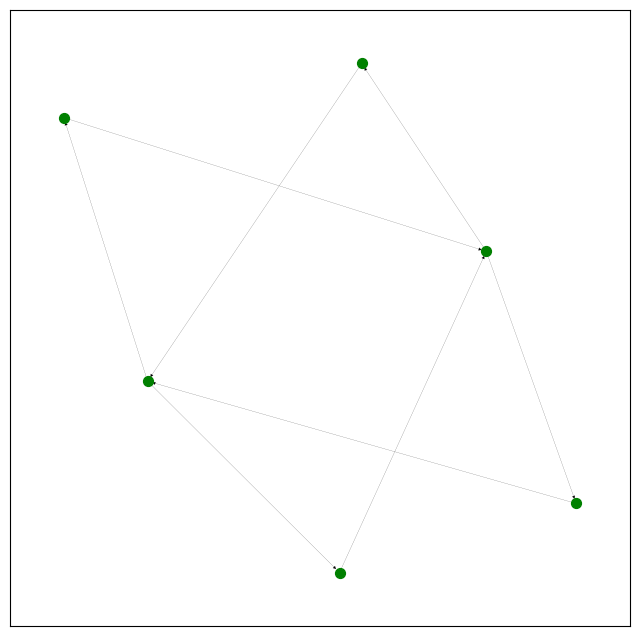

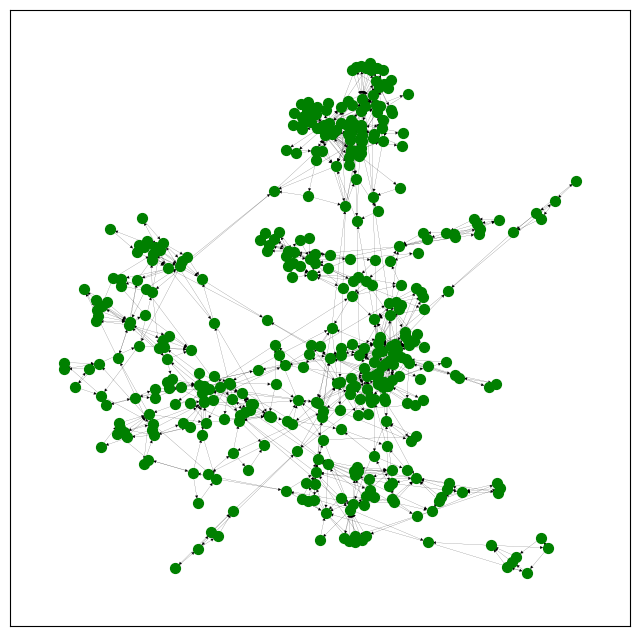

In [136]:
for i,d in enumerate(sugiyama_dicts_list):
    sG=sub_graph_list[i]
    pos=d
    #color=i

    #print(list(sG.nodes))
    #plt.figure(figsize=(10,10))
    #ax=plt.subplot()
    nx.draw_networkx(sG, with_labels=False,arrows=True,pos=None,node_size=50,arrowsize=5,width=0.1,node_color="green",labels=None,font_size=10,ax=None) #labels
    #plt.box(False)
    #plt.savefig('Document Figures/4osc_amortiguado_envisionment.png',bbox_inches='tight', pad_inches=0.075)
    plt.show()

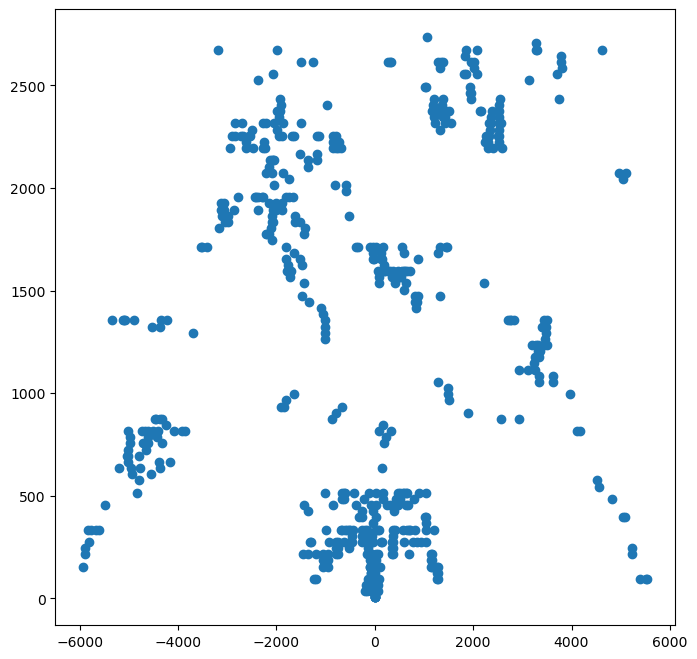

In [105]:
aux_positions_x=[]
aux_positions_y=[]
for node in sugiyama_dicts_list:
    res_x=[el[0] for el in list(node.values())]
    res_y=[el[1] for el in list(node.values())]
    aux_positions_x.extend(res_x)
    aux_positions_y.extend(res_y)
    #for node in x:
    #    print(node.keys())       #aux_positions.append(node.values())

plt.scatter(aux_positions_x,aux_positions_y)
#np.concatenate(aux_positions_x,axis=0)


In [107]:
pos_spring1=nx.spring_layout(G,pos=pos_sugiyama)
pos_spring2=nx.spring_layout(G)

pos_kawai=nx.kamada_kawai_layout(G,) #x
pos_spectral=nx.spectral_layout(G)

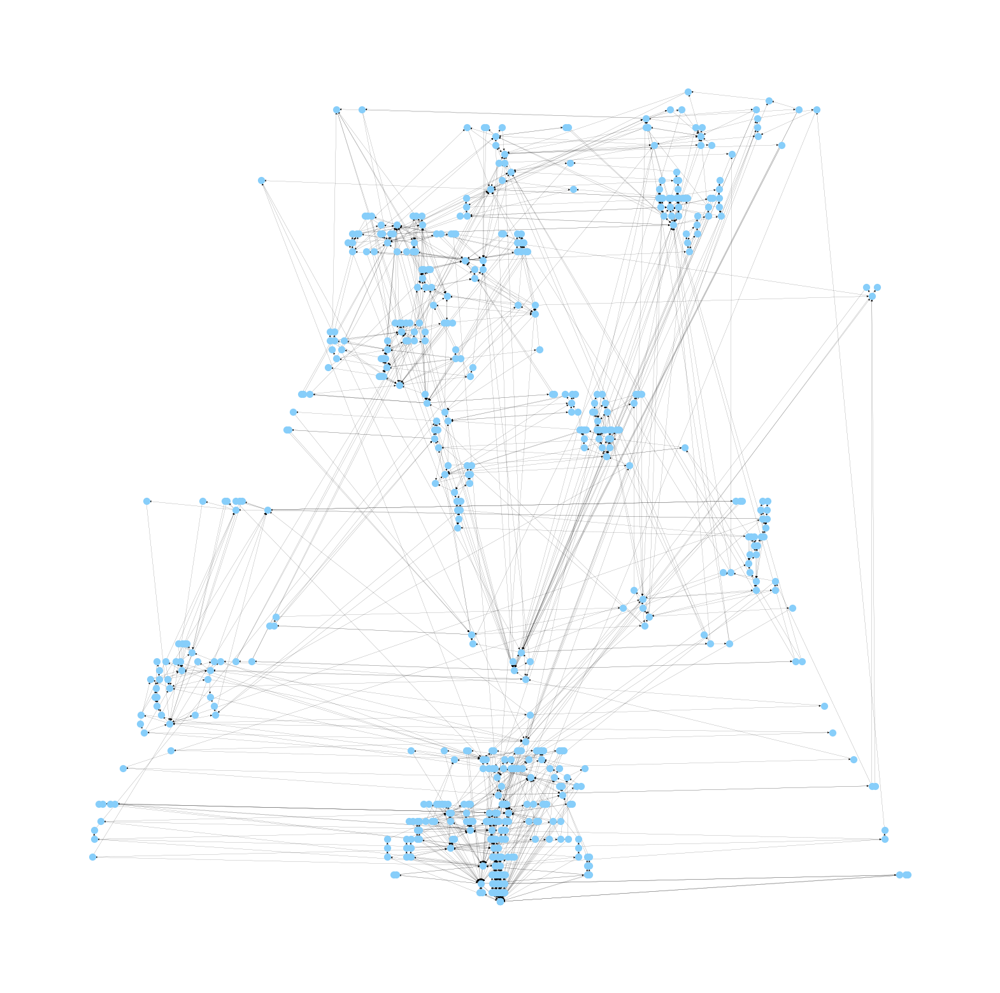

In [110]:

# labels = {}
# for i,node in enumerate(G.nodes()):
#     labels[node] = data_df[data_df["State"]==node]["loc"].apply(lambda x: str(x).replace("(","").replace(")","")).iloc[0]

#change info for stationary behavior
# stationary_state=HashableDict(stationary_behavior[0].name["State"])
# pos[stationary_state]=np.array([-250,5])
# labels[stationary_state]="STD"

plt.figure(figsize=(20,20))
ax=plt.subplot()

# # Draw the graph in the first subplot
nx.draw_networkx(G, with_labels=False,arrows=True,pos=pos_sugiyama,node_size=50,arrowsize=5,width=0.1,node_color="lightskyblue",labels=labels,font_size=10,ax=ax) #labels
plt.box(False)
#plt.savefig('Document Figures/4osc_amortiguado_envisionment.png',bbox_inches='tight', pad_inches=0.075)
plt.show()